In [128]:
from keras.models import Sequential
from keras.layers import Dense, GRU, LSTM
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler, StandardScaler, RobustScaler
from sklearn.compose import ColumnTransformer
import joblib
import os

In [129]:
SEED = 42424
np.random.seed(SEED)

os.environ['PYTHONHASHSEED'] = str(SEED)



In [130]:
# Load the data sets and combine them into a single usable dataframe called data series
data_series = pd.read_csv('./data/data_avg_temp.csv')

# rename columns to be more descriptive
data_series.columns = ['date', 'avg_temp', 'avg_temp_anomaly']
data_series.drop(columns=['avg_temp_anomaly'], inplace=True)

# append to the dataframe
data_cool_degree = pd.read_csv('./data/data_cool_degree_days.csv')
data_heat_degree = pd.read_csv('./data/data_heat_degree_days.csv')
data_max_temp = pd.read_csv('./data/data_max_temp.csv')
data_min_temp = pd.read_csv('./data/data_min_temp.csv')
data_palmer_z = pd.read_csv('./data/data_palmer_z.csv')
data_pdsi = pd.read_csv('./data/data_pdsi.csv')
data_phdi = pd.read_csv('./data/data_phdi.csv')
data_pmdi = pd.read_csv('./data/data_pmdi.csv')
data_precipitation = pd.read_csv('./data/data_precipitation.csv')



# Append columns to the data series
data_series['cool_degree_days'] = data_cool_degree['Value']
# data_series['cool_degree_days_anomaly'] = data_cool_degree['Anomaly']

data_series['heat_degree_days'] = data_heat_degree['Value']
# data_series['heat_degree_days_anomaly'] = data_heat_degree['Anomaly']

data_series['max_temp'] = data_max_temp['Value']
# data_series['max_temp_anomaly'] = data_max_temp['Anomaly']

data_series['min_temp'] = data_min_temp['Value']
# data_series['min_temp_anomaly'] = data_min_temp['Anomaly']

data_series['palmer_z'] = data_palmer_z['Value']
# data_series['palmer_z_anomaly'] = data_palmer_z['Anomaly']

data_series['pdsi'] = data_pdsi['Value']
# data_series['pdsi_anomaly'] = data_pdsi['Anomaly']

data_series['phdi'] = data_phdi['Value']
# data_series['phdi_anomaly'] = data_phdi['Anomaly']

data_series['pmdi'] = data_pmdi['Value']
# data_series['pmdi_anomaly'] = data_pmdi['Anomaly']

data_series['precipitation'] = data_precipitation['Value']
# data_series['precipitation_anomaly'] = data_precipitation['Anomaly']


In [131]:
# Convert dataframe to numpy array
avg_temp = data_series['avg_temp'].to_numpy()
data_series.drop(columns=['avg_temp'], inplace=True)

# x = data_series.to_numpy()

# Split the data into training and testing sets
# x_train, x_test, y_train, y_test = train_test_split(data_series, avg_temp, test_size=0.2, random_state=SEED)


std_scaler = StandardScaler()
x_train_scaled = std_scaler.fit_transform(data_series[['max_temp', 'min_temp', 'cool_degree_days', 'heat_degree_days']])
# x_test_scaled = std_scaler.transform(x_test[['max_temp', 'min_temp']])

# Append to x_train and x_test
robust_scaler = RobustScaler()
x_train_scaled = np.append(x_train_scaled, robust_scaler.fit_transform(data_series[['palmer_z', 'pdsi', 'phdi', 'pmdi']]), axis=1)
# x_test_scaled = np.append(x_test_scaled, robust_scaler.transform(x_test[['palmer_z', 'pdsi', 'phdi', 'pmdi']]), axis=1)

minmax_scaler = MinMaxScaler()
x_train_scaled = np.append(x_train_scaled, minmax_scaler.fit_transform(data_series[['precipitation']]), axis=1)
# x_test_scaled = np.append(x_test_scaled, minmax_scaler.transform(x_test[['precipitation']]), axis=1)

joblib.dump(std_scaler, 'std_scaler.joblib')
joblib.dump(robust_scaler, 'robust_scaler.joblib')
joblib.dump(minmax_scaler, 'minmax_scaler.joblib')



# Normalize the data
# Define the ColumnTransformer with appropriate scalers
# preprocessor = ColumnTransformer(
#     transformers=[
#         ('std', StandardScaler(), ['max_temp', 'min_temp']),
#         ('robust', RobustScaler(), ['cool_degree_days', 'heat_degree_days', 'palmer_z', 'pdsi', 'phdi', 'pmdi']),
#         ('minmax', MinMaxScaler(), ['precipitation'])
#     ]
# )

# Fit the ColumnTransformer to the data
# x_train_scaled = preprocessor.fit(x_train)
# x_test_scaled = preprocessor.transform(x_test)

# joblib.dump(preprocessor, 'preprocessor.joblib') 

# Convert the data for the GRU model to numpy
# x_train_scaled = x_train_scaled.to_numpy()
# x_test_scaled = x_test_scaled.to_numpy()

# Expand first dim
x_train_scaled = np.expand_dims(x_train_scaled, axis=0)
# x_test_scaled = np.expand_dims(x_test_scaled, axis=0)
y_train = np.expand_dims(avg_temp, axis=0)
# y_test = np.expand_dims(y_test, axis=0)

print(x_train_scaled.shape)


(1, 1537, 9)


In [132]:
# Train the GRU model
model_gru = Sequential(
    [
        GRU(20, activation='relu', 
        input_shape=(x_train_scaled.shape[1], x_train_scaled.shape[2])),
        Dense(1)
    ]
)

model_gru.compile(optimizer='adam', loss='mse')
model_gru.fit(x_train_scaled, y_train, epochs=10000, batch_size=1,verbose=1)


Epoch 1/10000


/Users/nicolaaswooters/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 668ms/step - loss: 2806.8799
Epoch 2/10000
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - loss: 2803.4207
Epoch 3/10000
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 2800.0039
Epoch 4/10000
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 2796.6157
Epoch 5/10000
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 2793.1523
Epoch 6/10000
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 2789.6851
Epoch 7/10000
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 2786.1921
Epoch 8/10000
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 2782.7063
Epoch 9/10000
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 2779.2554
Epoch 10/10000
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 2775.9551
Epoch 11/10000
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 2772.6575
Epoch 12/10000
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 2769.2993
Epoch 13/10000
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 2765.9456
Epoch 14/10000
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 2762.5835
Epoch 15/10000
1/1 ━━━━━━━

In [133]:
# Predict the temperature by regressing the other features and then predicting average temperature
parameters = ['max_temp', 'min_temp', 'cool_degree_days', 'heat_degree_days', 'palmer_z', 'pdsi', 'phdi', 'pmdi', 'precipitation']
models = {}
scalers = {}

date = data_series['date'].to_numpy()
date_splice = np.zeros((len(date), 2))

param_models = []

for i, element in enumerate(date):
    # print(element)
    # Splice this string to get year and month
    date_splice[i,0] = int(str(element)[0:4])
    date_splice[i,1] = int(str(element)[5:7])

for param in parameters:
    print(f"PARAM", param)
    y = data_series[param].to_numpy()
    X_train, X_test, y_train, y_test = train_test_split(date_splice, y, test_size=0.2, shuffle=False, random_state=SEED)

    model = Sequential([
        Dense(5, activation='relu', input_shape=(X_train.shape[1],)),  # input_shape=(2,)
        Dense(1)  # Output layer
    ])

    model.compile(optimizer='adam', loss='mse')
    model.fit(X_train, y_train, epochs=5000, batch_size=64, validation_data=(X_test, y_test), verbose=1)

    # Save model
    param_models.append(model)


PARAM max_temp


Epoch 1/5000


/Users/nicolaaswooters/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1389930.3750 - val_loss: 1320510.6250
Epoch 2/5000
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 998us/step - loss: 1191479.1250 - val_loss: 1133009.1250
Epoch 3/5000
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 966us/step - loss: 1022829.5000 - val_loss: 973718.3125
Epoch 4/5000
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 947us/step - loss: 880345.6250 - val_loss: 838842.9375
Epoch 5/5000
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 930us/step - loss: 759932.6875 - val_loss: 724378.5000
Epoch 6/5000
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 882us/step - loss: 656099.0000 - val_loss: 626991.1250
Epoch 7/5000
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 933us/step - loss: 567731.4375 - val_loss: 543906.0000
Epoch 8/5000
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 900us/step - loss: 492166.2500 - val_loss: 472725.7812
Epoch 9/5000
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 897us/step - loss: 428103.4688 - val_loss: 411584.5000
Epoch 10/5000
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 905us/step - loss: 373290.8750 - val_loss: 358868.7812
Epoch 11/5000
20/20 ━━━━━━━━━

In [134]:
# Prediction of the average temperature
# Using the trained models to predict the parameters and then use those predictions as input for the GRU model

years = 60
date_predict = np.zeros((years*12, 2))
for i in range(years*12):
    date_predict[i, 0] = 2024 + i // 12
    date_predict[i, 1] = 1 + i % 12


param_predicts = np.zeros((len(parameters),years*12))

#  Predict the parameters.
for k, model in enumerate(param_models):
    for i in range(years*12):
        answer = model.predict(date_predict[i].reshape(1, -1))
        param_predicts[k, i] = answer

yearmonth_vec = np.zeros((years*12,1))
for i in range(years*12):
    yearmonth_vec[i] = date_predict[i, 0] * 100 + date_predict[i, 1]

# params_predicts = np.append(yearmonth_vec, param_predicts.T, axis=1)

columns = ['max_temp', 'min_temp', 'cool_degree_days', 'heat_degree_days', 'palmer_z', 'pdsi', 'phdi', 'pmdi', 'precipitation']

df_predict = pd.DataFrame(param_predicts.T, columns=columns)

# Normalize the data with the same scalers
predict_scaled = std_scaler.transform(df_predict[['max_temp', 'min_temp', 'cool_degree_days', 'heat_degree_days']])
predict_scaled = np.append(predict_scaled, robust_scaler.transform(df_predict[['palmer_z', 'pdsi', 'phdi', 'pmdi']]), axis=1)
predict_scaled = np.append(predict_scaled, minmax_scaler.transform(df_predict[['precipitation']]), axis=1)

# predict_scaled = np.append(yearmonth_vec, predict_scaled, axis=1)

print(predict_scaled)



1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


/var/folders/ds/s8gbbjqx4pbct0mlwnl6j9sr0000gn/T/ipykernel_46169/1895178092.py:17: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  param_predicts[k, i] = answer


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
1/1 ━━━━━━━━━━━

In [135]:
print(predict_scaled.shape)

for i in range(years*12):
    print(f"Predicted parameters:")
    for j, param in enumerate(parameters):
        print(f"{param}: {predict_scaled[i,j]}")
    
    # print("\n")

(720, 9)
Predicted parameters:
max_temp: 1.5088394821969577
min_temp: 0.6147258457342998
cool_degree_days: -0.09207266844380478
heat_degree_days: -13.882193448994444
palmer_z: 0.1704207081347704
pdsi: 0.10479331670535934
phdi: 0.22910420158330133
pmdi: 0.276111058405371
precipitation: 0.3549044609516928
Predicted parameters:
max_temp: 1.5128562194788213
min_temp: 0.6196942019824014
cool_degree_days: -0.09250500828747563
heat_degree_days: -13.882193448994444
palmer_z: 0.17040878720581532
pdsi: 0.11450807907515101
phdi: 0.23000645228460723
pmdi: 0.2808659218526089
precipitation: 0.35488156919126157
Predicted parameters:
max_temp: 1.516872956760685
min_temp: 0.6247781013990636
cool_degree_days: -0.09293820171425342
heat_degree_days: -13.882193448994444
palmer_z: 0.17043262906372547
pdsi: 0.12420588723487323
phdi: 0.23091150791037315
pmdi: 0.28562078529984686
precipitation: 0.3548558159607763
Predicted parameters:
max_temp: 1.5208896940425485
min_temp: 0.6298620008157259
cool_degree_days: 

In [136]:

# Use predicted params for GRU input to predict avg_temp
predictions = []

for i in range(years*12):
    new_timestep = predict_scaled[i,:]
    new_timestep = np.expand_dims(new_timestep, axis=0)
    x = np.append(x_train_scaled[:,1:,:], np.expand_dims(new_timestep, axis=0), axis=1)

    # x = np.expand_dims(params_predicts[i, :], axis=0)
    avg_temp_predict = model_gru.predict(x)
    predictions.append(avg_temp_predict)


print(predictions)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━

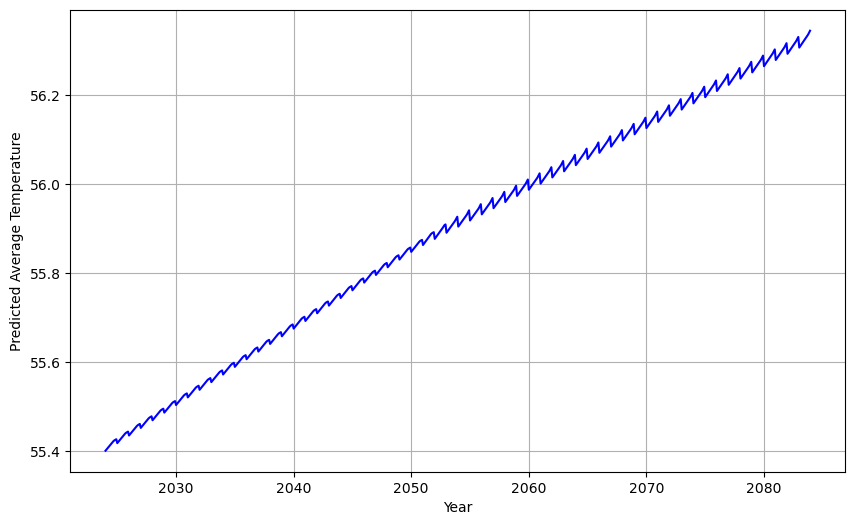

In [ ]:
# Flatten predictions
predictions = np.array(predictions).reshape(-1)

# Here I am applying an offset to stabilize our prediction: in this case it aligns our predictions with the LAST known temperature value
offset = 55.4 - predictions[0]
predictions += offset

# Converting the years/months into a float, this is so our x-axis shows the year value, and not how it is stored (202401)
years_float = date_predict[:, 0] + (date_predict[:, 1] - 1) / 12

plt.figure(figsize=(10, 6))
plt.plot(years_float, predictions, color='blue')
plt.xlabel('Year')
plt.ylabel('Predicted Average Temperature')
plt.grid(True)
plt.show()

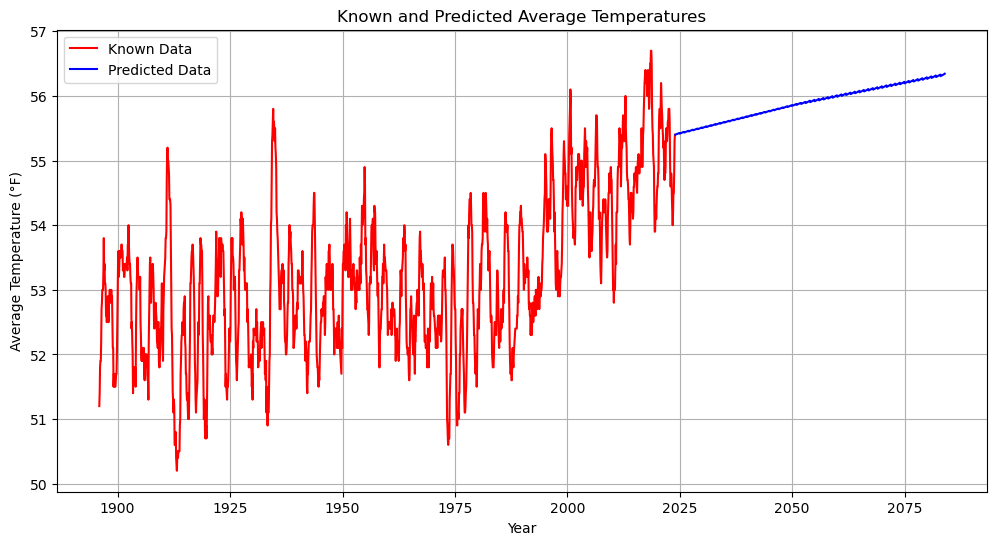

In [ ]:
# Read data
known_temperatures = pd.read_csv('./data/data_avg_temp.csv')
# Rename columns for simplicity
known_temperatures.columns = ['date', 'avg_temp', 'avg_temp_anomaly']
# Drop average temperature anomaly (we don't care about it)
known_temperatures.drop(columns=['avg_temp_anomaly'], inplace=True)
# Convert the 'date' column to datetime variable
known_temperatures['date'] = pd.to_datetime(known_temperatures['date'].astype(str), format='%Y%m')
# Grab the year (decimal years)
known_years_float = known_temperatures['date'].dt.year + (known_temperatures['date'].dt.month - 1) / 12
# All of our previous years' temperatures
known_temperatures_values = known_temperatures['avg_temp']

# Here I am applying an offset to stabilize our prediction: in this case it aligns our predictions with the LAST known temperature value
offset = known_temperatures['avg_temp'].iloc[-1] - predictions[0]  # Align predictions to the last known temperature
predictions += offset  # Apply the offset to the predictions

# Converting the years/months into a float, this is so our x-axis shows the year value, and not how it is stored (202401)
years_float = date_predict[:, 0] + (date_predict[:, 1] - 1) / 12

# Plot
plt.figure(figsize=(12, 6))
plt.plot(known_years_float, known_temperatures_values, color='red', label='Known Data')  # Plot known data in red
plt.plot(years_float, predictions, color='blue', label='Predicted Data')  # Plot predicted data in blue
plt.xlabel('Year')
plt.ylabel('Average Temperature (°F)')
plt.title('Known and Predicted Average Temperatures')
plt.grid(True)
plt.legend()
plt.show()


Epoch 1/10


/Users/nicolaaswooters/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


696/696 - 1s - 1ms/step - loss: 138282672.0000
Epoch 2/10
696/696 - 0s - 358us/step - loss: 136969680.0000
Epoch 3/10
696/696 - 0s - 357us/step - loss: 134547968.0000
Epoch 4/10
696/696 - 0s - 372us/step - loss: 131261944.0000
Epoch 5/10
696/696 - 0s - 390us/step - loss: 127231752.0000
Epoch 6/10
696/696 - 0s - 369us/step - loss: 122514664.0000
Epoch 7/10
696/696 - 0s - 344us/step - loss: 117186312.0000
Epoch 8/10
696/696 - 0s - 350us/step - loss: 111347144.0000
Epoch 9/10
696/696 - 0s - 365us/step - loss: 105061928.0000
Epoch 10/10
696/696 - 0s - 400us/step - loss: 98438200.0000
Epoch 1/5


/Users/nicolaaswooters/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


9/9 - 0s - 29ms/step - loss: 123222.6016
Epoch 2/5
9/9 - 0s - 1ms/step - loss: 97008.0469
Epoch 3/5
9/9 - 0s - 2ms/step - loss: 76963.7969
Epoch 4/5
9/9 - 0s - 2ms/step - loss: 61979.6562
Epoch 5/5
9/9 - 0s - 2ms/step - loss: 49200.5234
Epoch 1/5


/Users/nicolaaswooters/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


9/9 - 0s - 29ms/step - loss: 441163.0312
Epoch 2/5
9/9 - 0s - 1ms/step - loss: 373152.0000
Epoch 3/5
9/9 - 0s - 2ms/step - loss: 311977.1562
Epoch 4/5
9/9 - 0s - 2ms/step - loss: 257905.7500
Epoch 5/5
9/9 - 0s - 2ms/step - loss: 210872.9844
Epoch 1/5


/Users/nicolaaswooters/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


9/9 - 0s - 30ms/step - loss: 135179.7031
Epoch 2/5
9/9 - 0s - 1ms/step - loss: 107610.5781
Epoch 3/5
9/9 - 0s - 2ms/step - loss: 83994.6406
Epoch 4/5
9/9 - 0s - 2ms/step - loss: 64318.3750
Epoch 5/5
9/9 - 0s - 2ms/step - loss: 48319.3906
Epoch 1/5


/Users/nicolaaswooters/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


9/9 - 0s - 28ms/step - loss: 124404.3594
Epoch 2/5
9/9 - 0s - 2ms/step - loss: 92752.7422
Epoch 3/5
9/9 - 0s - 2ms/step - loss: 68736.2031
Epoch 4/5
9/9 - 0s - 1ms/step - loss: 51044.0469
Epoch 5/5
9/9 - 0s - 2ms/step - loss: 39227.3945
Epoch 1/5


/Users/nicolaaswooters/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


9/9 - 0s - 27ms/step - loss: 15221942.0000
Epoch 2/5
9/9 - 0s - 1ms/step - loss: 15033865.0000
Epoch 3/5
9/9 - 0s - 2ms/step - loss: 14844868.0000
Epoch 4/5
9/9 - 0s - 2ms/step - loss: 14654141.0000
Epoch 5/5
9/9 - 0s - 2ms/step - loss: 14461174.0000
Epoch 1/5


/Users/nicolaaswooters/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


9/9 - 1s - 70ms/step - loss: 2895386.2500
Epoch 2/5
9/9 - 0s - 2ms/step - loss: 2666757.7500
Epoch 3/5
9/9 - 0s - 2ms/step - loss: 2450709.2500
Epoch 4/5
9/9 - 0s - 2ms/step - loss: 2247846.7500
Epoch 5/5
9/9 - 0s - 2ms/step - loss: 2058279.6250
Epoch 1/5


/Users/nicolaaswooters/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


9/9 - 0s - 29ms/step - loss: 4301256.5000
Epoch 2/5
9/9 - 0s - 1ms/step - loss: 3985573.7500
Epoch 3/5
9/9 - 0s - 2ms/step - loss: 3690315.5000
Epoch 4/5
9/9 - 0s - 2ms/step - loss: 3415958.5000
Epoch 5/5
9/9 - 0s - 2ms/step - loss: 3162193.0000
Epoch 1/5


/Users/nicolaaswooters/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


9/9 - 0s - 28ms/step - loss: 48022.1523
Epoch 2/5
9/9 - 0s - 1ms/step - loss: 37526.3125
Epoch 3/5
9/9 - 0s - 2ms/step - loss: 28571.2324
Epoch 4/5
9/9 - 0s - 1ms/step - loss: 21170.8027
Epoch 5/5
9/9 - 0s - 2ms/step - loss: 15256.2822
Epoch 1/5


/Users/nicolaaswooters/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


9/9 - 0s - 27ms/step - loss: 2725963.2500
Epoch 2/5
9/9 - 0s - 1ms/step - loss: 2557061.2500
Epoch 3/5
9/9 - 0s - 2ms/step - loss: 2398315.7500
Epoch 4/5
9/9 - 0s - 2ms/step - loss: 2249866.2500
Epoch 5/5
9/9 - 0s - 1ms/step - loss: 2111639.7500
Epoch 1/5


/Users/nicolaaswooters/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


9/9 - 0s - 28ms/step - loss: 153.0195
Epoch 2/5
9/9 - 0s - 1ms/step - loss: 42.6779
Epoch 3/5
9/9 - 0s - 2ms/step - loss: 18.9143
Epoch 4/5
9/9 - 0s - 1ms/step - loss: 15.6037
Epoch 5/5
9/9 - 0s - 2ms/step - loss: 9.0991
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 365us/step
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 359us/step
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 347us/step
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 317us/step
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 307us/step
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 304us/step
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 322us/step
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 309us/step
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 30

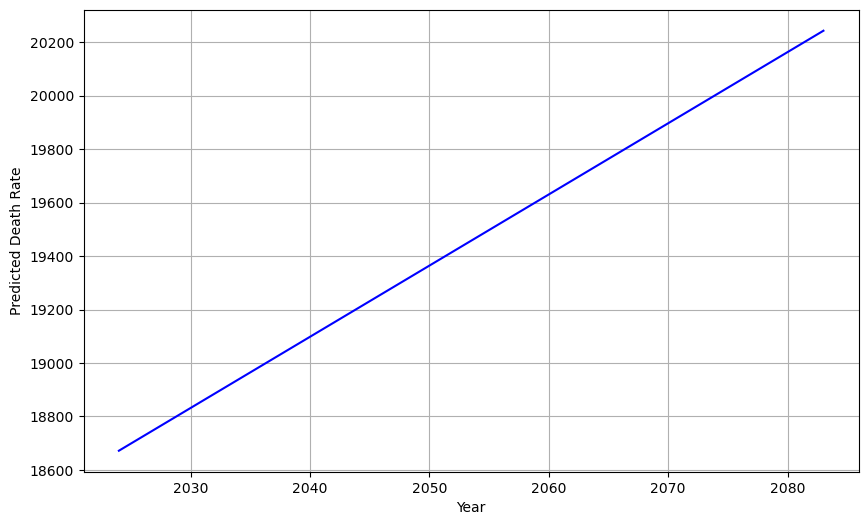

In [167]:
# Read data
death_rate_data = pd.read_excel('data/Death_Rate.xlsx').dropna() # Drops NaNs
death_rate_data['Year'] = death_rate_data['Year'].astype(int) # Make sure 'Year' column is an integer

# Below I reload all features again- not necessary
############################
# Load all features
data_series = pd.read_csv('./data/data_avg_temp.csv')
data_series.columns = ['date', 'avg_temp', 'avg_temp_anomaly']
data_series.drop(columns=['avg_temp_anomaly'], inplace=True)
# append to the dataframe
data_cool_degree = pd.read_csv('./data/data_cool_degree_days.csv')
data_heat_degree = pd.read_csv('./data/data_heat_degree_days.csv')
data_max_temp = pd.read_csv('./data/data_max_temp.csv')
data_min_temp = pd.read_csv('./data/data_min_temp.csv')
data_palmer_z = pd.read_csv('./data/data_palmer_z.csv')
data_pdsi = pd.read_csv('./data/data_pdsi.csv')
data_phdi = pd.read_csv('./data/data_phdi.csv')
data_pmdi = pd.read_csv('./data/data_pmdi.csv')
data_precipitation = pd.read_csv('./data/data_precipitation.csv')
# Append columns to the data series
data_series['cool_degree_days'] = data_cool_degree['Value']
# data_series['cool_degree_days_anomaly'] = data_cool_degree['Anomaly']
data_series['heat_degree_days'] = data_heat_degree['Value']
# data_series['heat_degree_days_anomaly'] = data_heat_degree['Anomaly']
data_series['max_temp'] = data_max_temp['Value']
# data_series['max_temp_anomaly'] = data_max_temp['Anomaly']
data_series['min_temp'] = data_min_temp['Value']
# data_series['min_temp_anomaly'] = data_min_temp['Anomaly']
data_series['palmer_z'] = data_palmer_z['Value']
# data_series['palmer_z_anomaly'] = data_palmer_z['Anomaly']
data_series['pdsi'] = data_pdsi['Value']
# data_series['pdsi_anomaly'] = data_pdsi['Anomaly']
data_series['phdi'] = data_phdi['Value']
# data_series['phdi_anomaly'] = data_phdi['Anomaly']
data_series['pmdi'] = data_pmdi['Value']
# data_series['pmdi_anomaly'] = data_pmdi['Anomaly']
data_series['precipitation'] = data_precipitation['Value']
# data_series['precipitation_anomaly'] = data_precipitation['Anomaly']
############################

# This is important, it extracts the year, and adds it to a new column called 'year'
# We do this so that the two dataframes have the same format for time (death_rate_data only has 'Year')
data_series['year'] = pd.to_datetime(data_series['date'], format='%Y%m', errors='coerce').dt.year
# Now we filter for where both datasets overlap in years (for data_series)
filtered_data_series = data_series[data_series['year'].isin(death_rate_data['Year'])]
# Now we merge the two datasets together, now that they have the same years
death_rate_merged = pd.merge(death_rate_data, filtered_data_series, left_on='Year', right_on='year', how='inner')
# Here we drop the columns related to time, we don't want them for our features or target
death_rate_merged.drop(columns=['date', 'year'], inplace=True)

# Below are our features and target- note, we can include population & births if we so choose, just remove them from the .drop()
death_rate_features = death_rate_merged.drop(columns=['Year', 'Deaths', 'Population', 'Births'])
death_rate_target = death_rate_merged['Deaths'] # 'Deaths' is our target

# Scaling
std_scaler = StandardScaler()
x_train_scaled = std_scaler.fit_transform(death_rate_features[['max_temp', 'min_temp', 'avg_temp','cool_degree_days', 'heat_degree_days']])
robust_scaler = RobustScaler()
x_train_scaled = np.append(x_train_scaled, robust_scaler.fit_transform(death_rate_features[['palmer_z', 'pdsi', 'phdi', 'pmdi']]), axis=1)
minmax_scaler = MinMaxScaler()
x_train_scaled = np.append(x_train_scaled, minmax_scaler.fit_transform(death_rate_features[['precipitation']]), axis=1)
# Saves scalers for later- reduces variability, ensures consistent transformation
joblib.dump(std_scaler, 'std_scaler.joblib')
joblib.dump(robust_scaler, 'robust_scaler.joblib')
joblib.dump(minmax_scaler, 'minmax_scaler.joblib')

# Expands the shape of the array for manipulation/compatibility purposes
x_train_scaled = np.expand_dims(x_train_scaled, axis=1)
y_train = np.expand_dims(death_rate_target.to_numpy(), axis=1)

## Train GRU model for death rate prediction
# 20 neurons; RELU activation function; input_shape=(timesteps, features at each timestep); 1 dense layer (single output/neuron)
model_gru = Sequential([
    GRU(20, activation='relu', input_shape=(x_train_scaled.shape[1], x_train_scaled.shape[2])),
    Dense(1)  # Output: death rate
])

## Compile the model (configure it for training)
# ADAM optimizer function; mean squared error loss
model_gru.compile(optimizer='adam', loss='mse')

## Fit (train) the model on the dataset
model_gru.fit(x_train_scaled, y_train, epochs=10, batch_size=1, verbose=2)

# Define parameters to be predicted
parameters = ['max_temp', 'min_temp','avg_temp', 'cool_degree_days', 'heat_degree_days', 'palmer_z', 'pdsi', 'phdi', 'pmdi', 'precipitation']
param_models = []

# Train secondary models for predicting each parameter
# Each parameter is treated as a target variable with its own model
for param in parameters:
    y = death_rate_features[param].to_numpy() # Convert data to numpy array
    date_splice = death_rate_merged[['Year']].to_numpy()  # Use merged data to ensure alignment
    X_train, X_test, y_train, y_test = train_test_split(date_splice, y, test_size=0.2, shuffle=False) # Split into test, train

    # Sequential model
    model = Sequential([
        Dense(5, activation='relu', input_shape=(X_train.shape[1],)),  # Input shape: year data
        Dense(1)
    ])
    model.compile(optimizer='adam', loss='mse')
    model.fit(X_train, y_train, epochs=5, batch_size=64, verbose=2)
    param_models.append(model)

# Predict future parameters
years = 60 # 60 years in the future
date_predict = np.zeros((years, 1)) # Initialize variable
for i in range(years):
    date_predict[i, 0] = 2024 + i # date_predict is made up of our years of interest for predictions

# Predict future parameters using secondary models
param_predicts = np.zeros((len(parameters), years))
for k, model in enumerate(param_models):
    param_predicts[k, :] = model.predict(date_predict).reshape(-1) # For each model, predict the values of the parameter for years in 'date_predict' (9,  60)

# Convert to a dataframe, where the columns are the parameters
df_predict = pd.DataFrame(param_predicts.T, columns=parameters)

# Use the same scalers from above to scale these predictions, then append to predict_scaled
predict_scaled = std_scaler.transform(df_predict[['max_temp', 'min_temp', 'avg_temp', 'cool_degree_days', 'heat_degree_days']])
predict_scaled = np.append(predict_scaled, robust_scaler.transform(df_predict[['palmer_z', 'pdsi', 'phdi', 'pmdi']]), axis=1)
predict_scaled = np.append(predict_scaled, minmax_scaler.transform(df_predict[['precipitation']]), axis=1)
predict_scaled = np.expand_dims(predict_scaled, axis=1) # Expands the shape of the array for manipulation/compatibility purposes

# Initialize predictions variable for death rate
predictions = []
# Loop through each year
for i in range(years):
    new_timestep = np.expand_dims(param_predicts[:, i], axis=0) # Selects predictions for all parameters of year 'i', then make it 2D (expand)
    new_timestep = np.expand_dims(new_timestep, axis=1) # Adds another dimension (1,1,9)

    new_timestep_repeated = np.repeat(new_timestep, x_train_scaled.shape[0], axis=0) # Aligns with the shape of the original training data

    # This makes the final shape of x be (number_of_training_samples, time_steps, features + 9) where 9 represents the additional features (predicted parameters)
    x = np.concatenate([x_train_scaled[:, 1:, :], new_timestep_repeated], axis=1)

    # Use the GRU model to predict based on x which includes the past data and the predicted parameters for the current year
    death_rate_predict = model_gru.predict(x)

    # Take the mean prediction across all samples for the given year
    predictions.append(np.mean(death_rate_predict))

# Here I am applying an offset to stabilize our prediction: in this case it aligns our predictions with the LAST known temperature value
predictions = np.array(predictions) # Convert to array first to apply offset
offset = death_rate_data['Deaths'].iloc[0] - predictions[0]  # Align predictions to the last known temperature
predictions += offset

plt.figure(figsize=(10, 6))
plt.plot(range(2024, 2024 + years), predictions, color='blue')
plt.xlabel('Year')
plt.ylabel('Predicted Death Rate')
plt.grid(True)
plt.show()
